<center><font size=6> Bank Churn Prediction </font></center>

## Problem Statement

### Context

Businesses like banks which provide service have to worry about problem of 'Customer Churn' i.e. customers leaving and joining another service provider. It is important to understand which aspects of the service influence a customer's decision in this regard. Management can concentrate efforts on improvement of service, keeping in mind these priorities.

### Objective

You as a Data scientist with the  bank need to  build a neural network based classifier that can determine whether a customer will leave the bank  or not in the next 6 months.

### Data Dictionary

* CustomerId: Unique ID which is assigned to each customer

* Surname: Last name of the customer

* CreditScore: It defines the credit history of the customer.
  
* Geography: A customer’s location
   
* Gender: It defines the Gender of the customer
   
* Age: Age of the customer
    
* Tenure: Number of years for which the customer has been with the bank

* NumOfProducts: refers to the number of products that a customer has purchased through the bank.

* Balance: Account balance

* HasCrCard: It is a categorical variable which decides whether the customer has credit card or not.

* EstimatedSalary: Estimated salary

* isActiveMember: Is is a categorical variable which decides whether the customer is active member of the bank or not ( Active member in the sense, using bank products regularly, making transactions etc )

* Exited : whether or not the customer left the bank within six month. It can take two values
** 0=No ( Customer did not leave the bank )
** 1=Yes ( Customer left the bank )

In [5]:
#Installing the libraries with the specified version.
# !pip install tensorflow==2.15.0 scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.24.1 pandas==1.5.3 -q --user --no-warn-script-location

## Importing necessary libraries

In [158]:
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Library to split data
from sklearn.model_selection import train_test_split

# library to import to standardize the data
from sklearn.preprocessing import StandardScaler, LabelEncoder

# importing different functions to build models
import tensorflow as tf
from tensorflow import keras
from keras import backend
from keras.models import Sequential
from keras.layers import Dense, Dropout

# importing SMOTE
from imblearn.over_sampling import SMOTE

# importing metrics
from sklearn.metrics import confusion_matrix,roc_curve,classification_report,recall_score

import random

# Library to avoid the warnings
import warnings
warnings.filterwarnings("ignore")

In [159]:
# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) backend random seed
# 3) `python` random seed
keras.utils.set_random_seed(812)

# If using TensorFlow, this will make GPU ops as deterministic as possible,
# but it will affect the overall performance, so be mindful of that.
tf.config.experimental.enable_op_determinism()

## Loading the dataset

In [8]:
from google.colab import drive
drive.mount('/content/drive')
file = r'/content/drive/MyDrive/AI Class/Projects/Project 4/bank-1.csv'
data = pd.read_csv(file)

Mounted at /content/drive


## Data Overview

In [9]:
data.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [10]:
# checking shape of the data
print(f"There are {data.shape[0]} rows and {data.shape[1]} columns.")

There are 10000 rows and 14 columns.


In [11]:
# let's view a sample of the data
data.sample(n=10, random_state=1)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9953,9954,15655952,Burke,550,France,Male,47,2,0.00,2,1,1,97057.28,0
3850,3851,15775293,Stephenson,680,France,Male,34,3,143292.95,1,1,0,66526.01,0
4962,4963,15665088,Gordon,531,France,Female,42,2,0.00,2,0,1,90537.47,0
3886,3887,15720941,Tien,710,Germany,Male,34,8,147833.30,2,0,1,1561.58,0
5437,5438,15733476,Gonzalez,543,Germany,Male,30,6,73481.05,1,1,1,176692.65,0
8517,8518,15671800,Robinson,688,France,Male,20,8,137624.40,2,1,1,197582.79,0
2041,2042,15709846,Yeh,840,France,Female,39,1,94968.97,1,1,0,84487.62,0
1989,1990,15622454,Zaitsev,695,Spain,Male,28,0,96020.86,1,1,1,57992.49,0
1933,1934,15815560,Bogle,666,Germany,Male,74,7,105102.50,1,1,1,46172.47,0
9984,9985,15696175,Echezonachukwu,602,Germany,Male,35,7,90602.42,2,1,1,51695.41,0


In [12]:
# let's create a copy of the data to avoid any changes to original data
df = data.copy()

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [14]:
# checking for duplicate values
df.duplicated().sum()

np.int64(0)

In [15]:
df[df.duplicated(keep=False) == True]

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited


In [16]:
df.isnull().sum()

,0
RowNumber,0
CustomerId,0
Surname,0
CreditScore,0
Geography,0
Gender,0
Age,0
Tenure,0
Balance,0
NumOfProducts,0


In [17]:
df.nunique()

,0
RowNumber,10000
CustomerId,10000
Surname,2932
CreditScore,460
Geography,3
Gender,2
Age,70
Tenure,11
Balance,6382
NumOfProducts,4


In [18]:
df = df.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1)

## Exploratory Data Analysis

### Univariate Analysis

In [19]:
# creating a copy of the dataframe
df1 = df.copy()

In [20]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [21]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

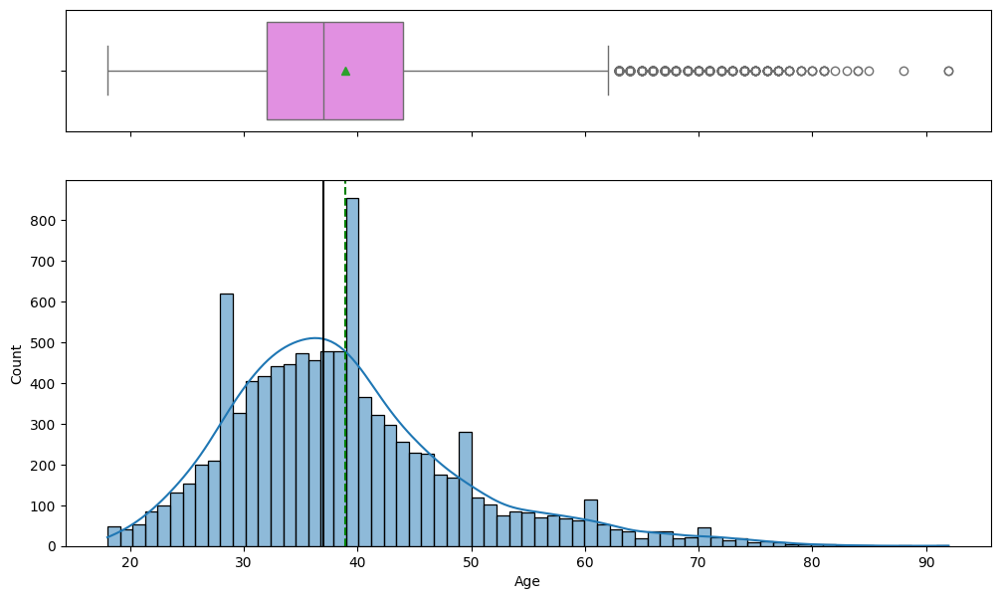

In [156]:
histogram_boxplot(df1, "Age", kde=True)

#STD of age is in the middle, late 30s to early 40s

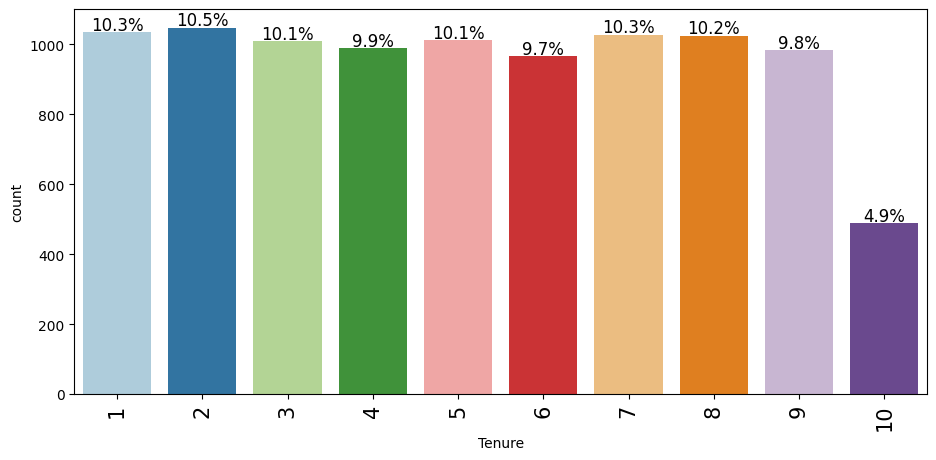

In [23]:
labeled_barplot(df1, "Tenure", perc=True, n=10)

#Highest tenure of members is 10 yrs but also the lowest count, highest count is second yr members with post 1 yr usage

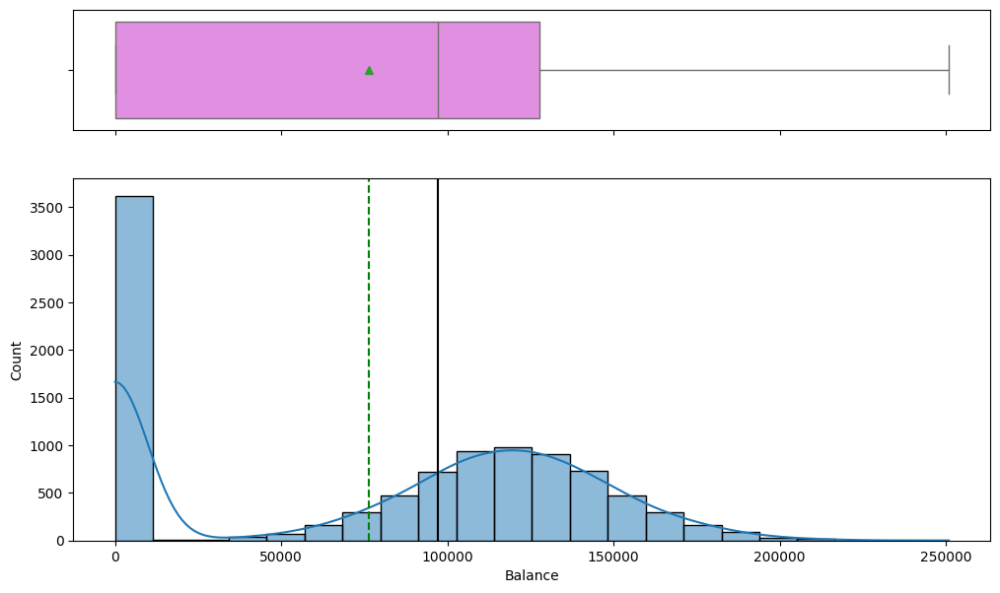

In [24]:
histogram_boxplot(df1, "Balance", kde=True)

#majority of people dont have anything in their accs as of yet since they might be new, median is nearing $125k

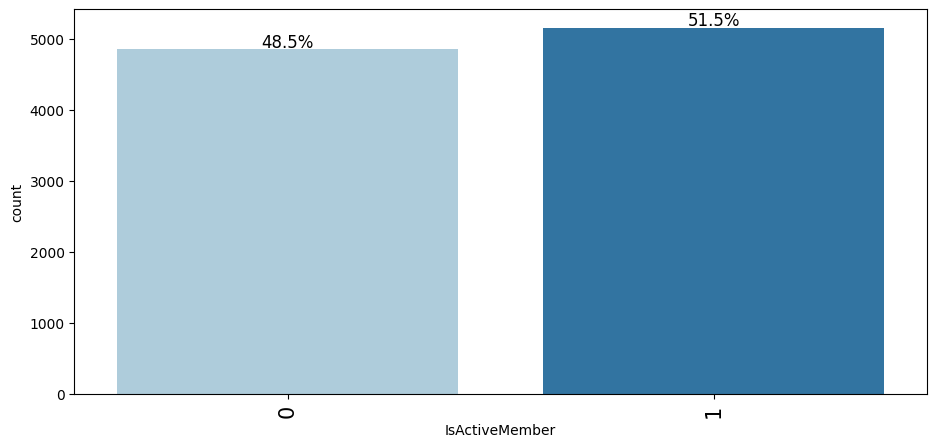

In [26]:
labeled_barplot(df1, "IsActiveMember", perc=True, n=10)

#fairly even split for active vs non active members

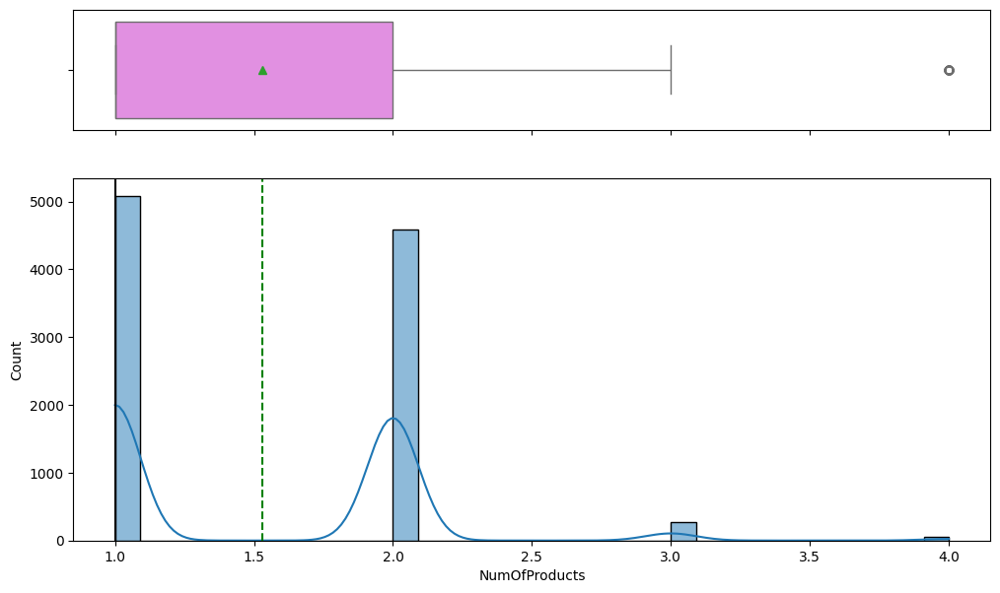

In [27]:
histogram_boxplot(df1, "NumOfProducts", kde=True)

#members either have 1 product, which is the highest count, 2 which is second or 3, the least, fairly easy graph to understand

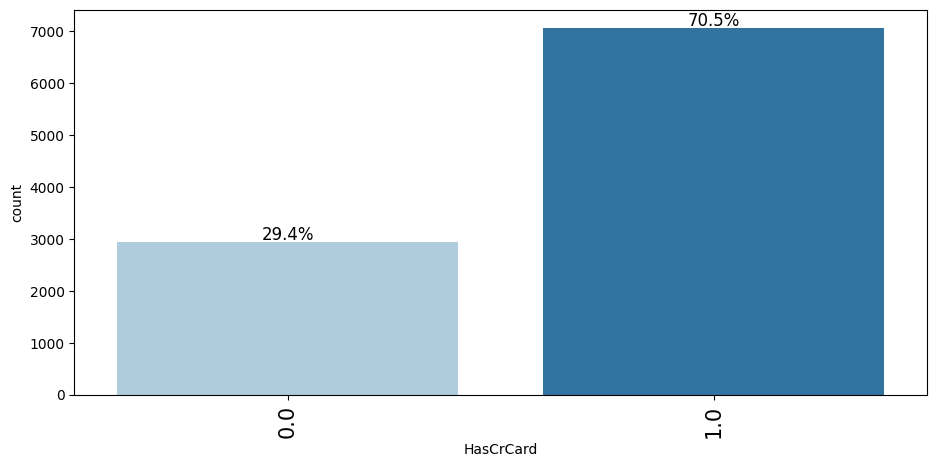

In [175]:
labeled_barplot(df1, "HasCrCard", perc=True, n=10)
# yes or no, 70% of members have a card, good area to avoid, they wont leave, 30% is target

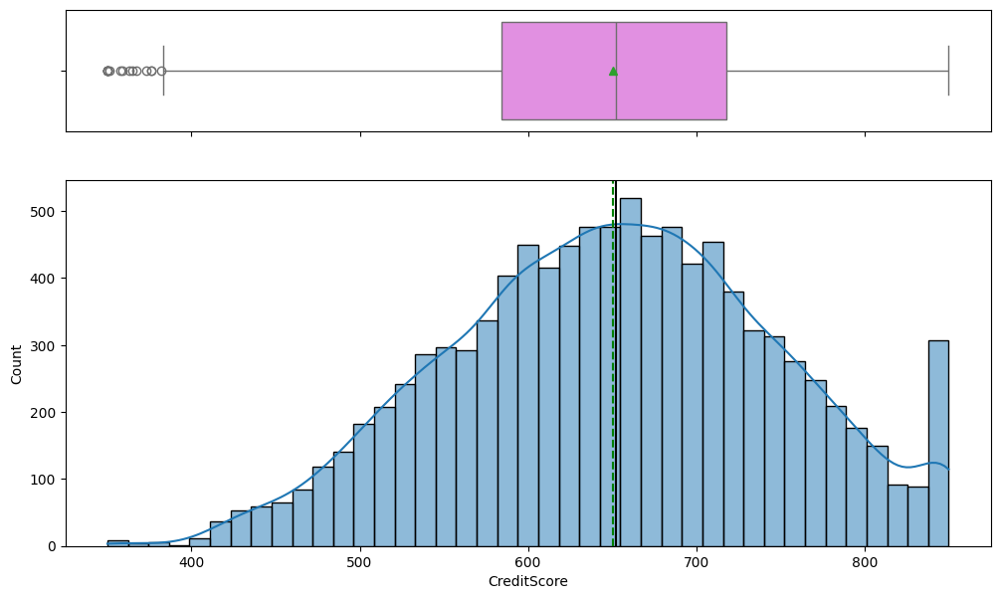

In [29]:
histogram_boxplot(df1, "CreditScore", kde=True)

# some outliers in the front, STD is leaning near 650 credit score, not too bad but nothing great

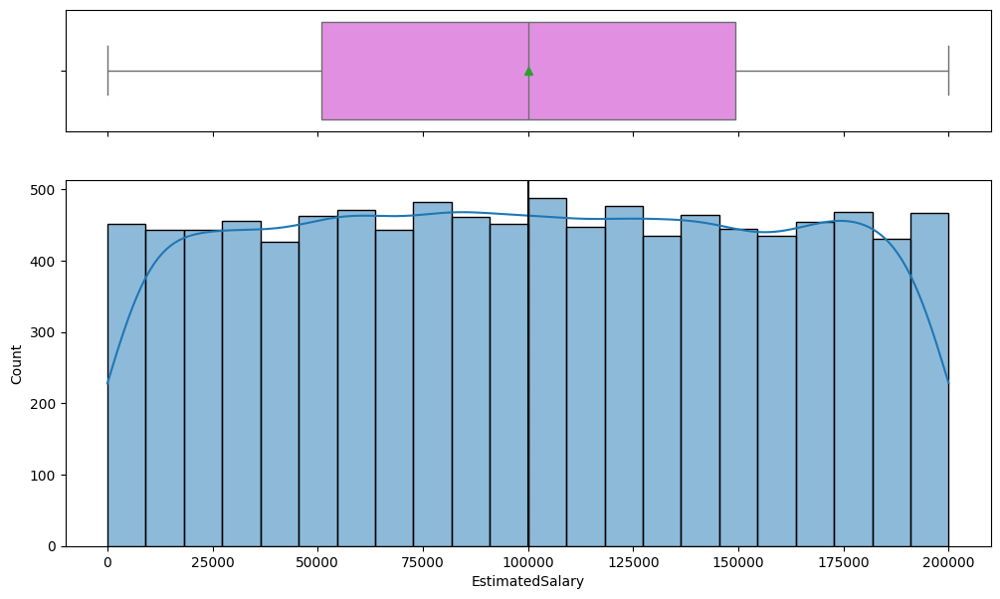

In [177]:
histogram_boxplot(df1, "EstimatedSalary", kde=True)

# hard to deduct anything from this graph, people make money, or dont

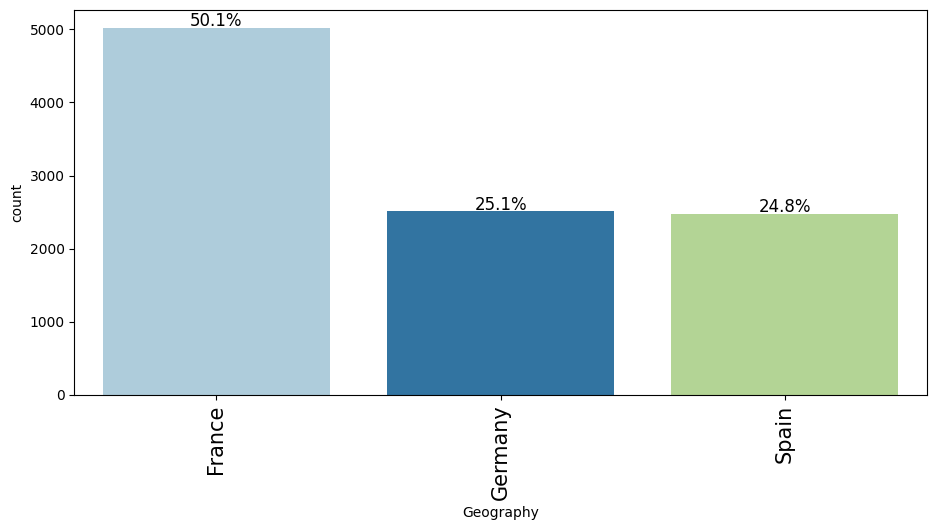

In [168]:
labeled_barplot(df, "Geography", perc=True, n=10)

# breakdown of locations of members, good idea to look into churn rate of those folks in these regions

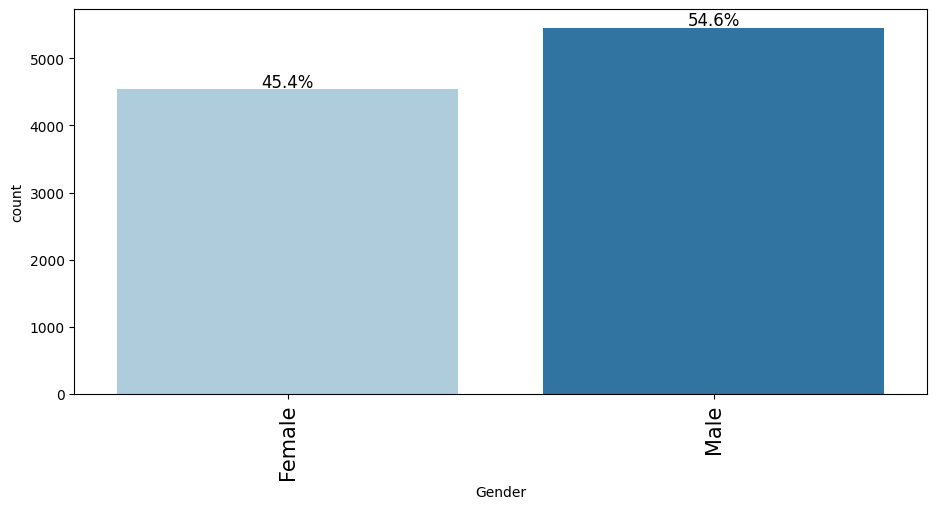

In [167]:
labeled_barplot(df, "Gender", perc=True, n=10)

# gender graph

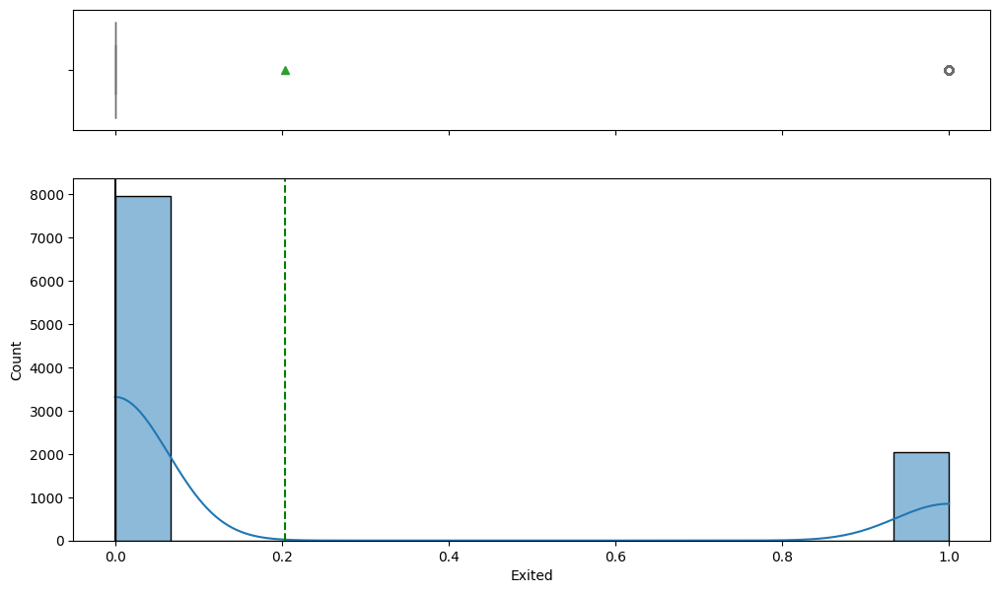

In [31]:
histogram_boxplot(df1, "Exited", kde=True)

# left or stayed

### Bivariate Analysis

In [32]:
# function to plot stacked bar chart


def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left",
        frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

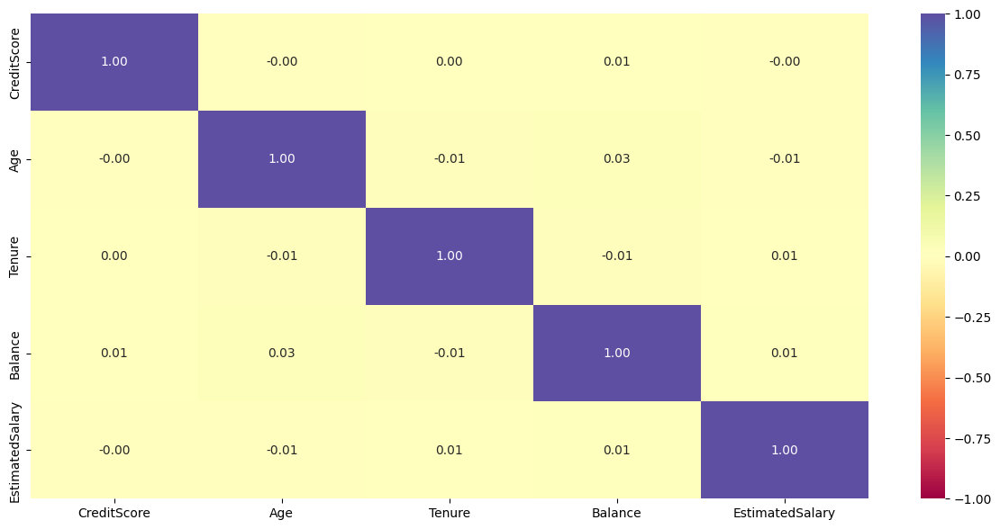

In [33]:
# defining the list of numerical columns
cols_list = ["CreditScore","Age","Tenure","Balance","EstimatedSalary"]

plt.figure(figsize=(15, 7))
sns.heatmap(df1[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

Exited             0     1    All
IsActiveMember                   
All             7963  2037  10000
0               3547  1302   4849
1               4416   735   5151
------------------------------------------------------------------------------------------------------------------------


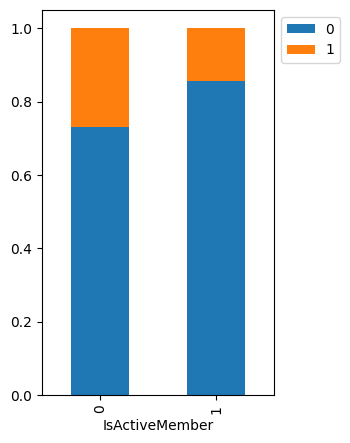

In [34]:
stacked_barplot(df1, "IsActiveMember", "Exited")

# non active members leaving is usual

Exited            0     1    All
NumOfProducts                   
All            7963  2037  10000
1              3675  1409   5084
2              4242   348   4590
3                46   220    266
4                 0    60     60
------------------------------------------------------------------------------------------------------------------------


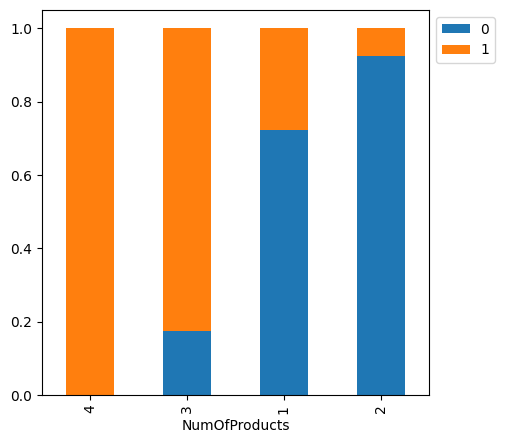

In [35]:
stacked_barplot(df1, "NumOfProducts", "Exited")

# higher the products the higher likelihood they leave, fewer stay, good correlation

Exited        0     1    All
HasCrCard                   
All        7963  2037  10000
1          5631  1424   7055
0          2332   613   2945
------------------------------------------------------------------------------------------------------------------------


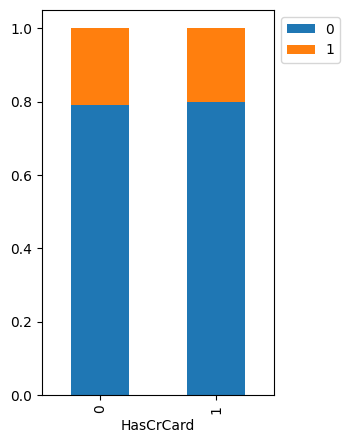

In [36]:
stacked_barplot(df1, "HasCrCard", "Exited")

# even down the line

Exited        0     1    All
Geography                   
All        7963  2037  10000
Germany    1695   814   2509
France     4204   810   5014
Spain      2064   413   2477
------------------------------------------------------------------------------------------------------------------------


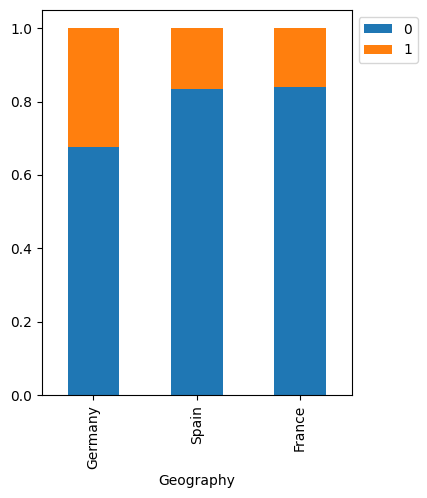

In [170]:
stacked_barplot(df, "Geography", "Exited")

# higher numbers of folks left in germany, might be something to look into, also opposite for the other 2 regions

Exited     0     1    All
Gender                   
All     7963  2037  10000
Female  3404  1139   4543
Male    4559   898   5457
------------------------------------------------------------------------------------------------------------------------


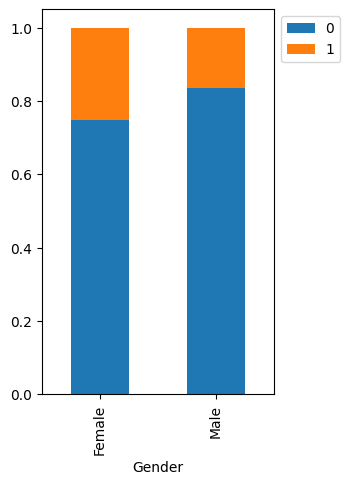

In [174]:
stacked_barplot(df, "Gender", "Exited")

# higher number of females leaving than males

Exited     0     1    All
Age                      
All     7963  2037  10000
46       135    91    226
40       343    89    432
43       209    88    297
45       142    87    229
..       ...   ...    ...
81         4     0      4
83         1     0      1
85         1     0      1
88         1     0      1
92         2     0      2

[71 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


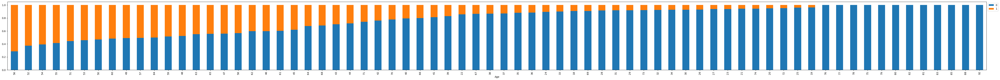

In [173]:
stacked_barplot(df, "Age", "Exited")

# as age increases, likelihood of member leaving slims down, too much hassle, younger people are making changes

In [172]:
stacked_barplot(df, "Balance", "Exited")

# too big of a graph to deduce anything, but after some point its all blue meaning people are staying

Exited        0     1    All
Balance                     
All        7963  2037  10000
0.0        3117   500   3617
117206.3      0     1      1
91592.06      0     1      1
91536.93      0     1      1
...         ...   ...    ...
212778.2      1     0      1
212696.32     1     0      1
212692.97     1     0      1
212314.03     1     0      1
206868.78     1     0      1

[6383 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


Exited     0     1    All
Tenure                   
All     7963  2037  10000
1        803   232   1035
9        771   213    984
3        796   213   1009
5        803   209   1012
4        786   203    989
2        847   201   1048
8        828   197   1025
6        771   196    967
7        851   177   1028
10       389   101    490
0        318    95    413
------------------------------------------------------------------------------------------------------------------------


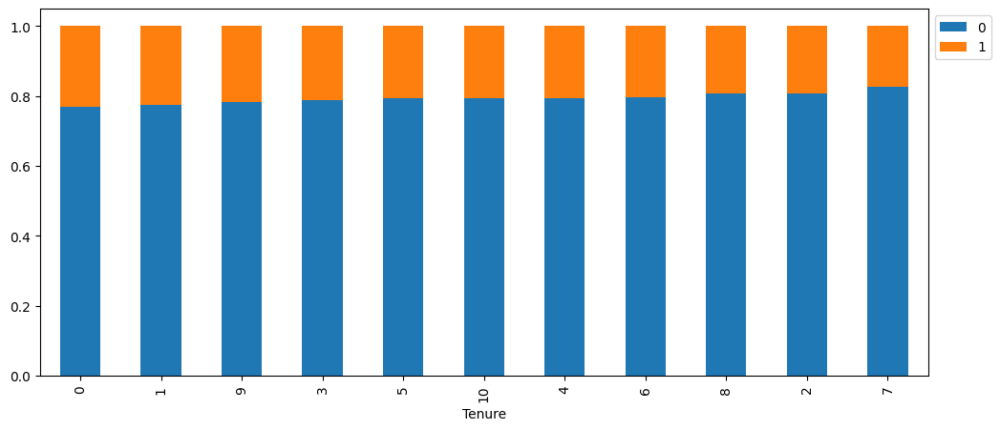

In [171]:
stacked_barplot(df, "Tenure", "Exited")

# people with no tenure, < a year, are leaving sooner than later

Exited          0     1    All
CreditScore                   
All          7963  2037  10000
850           190    43    233
651            33    17     50
705            37    16     53
637            32    14     46
...           ...   ...    ...
830             2     0      2
801             7     0      7
837             8     0      8
810             6     0      6
848             5     0      5

[461 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


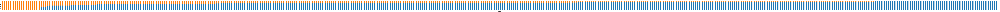

In [37]:
stacked_barplot(df1, "CreditScore", "Exited")

# as credit score increases, people are more likely to stay

In [38]:
stacked_barplot(df1, "EstimatedSalary", "Exited")

Exited              0     1    All
EstimatedSalary                   
All              7963  2037  10000
91098.76            0     1      1
91167.19            0     1      1
91556.57            0     1      1
91560.63            0     1      1
...               ...   ...    ...
90304.01            1     0      1
90284.47            1     0      1
90280.7             1     0      1
90273.85            1     0      1
90605.05            1     0      1

[10000 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


## Data Preprocessing

### Dummy Variable Creation

In [40]:
df1 = pd.get_dummies(df1,columns=df1.select_dtypes(include=["object"]).columns.tolist(),drop_first=True)
df1 = df1.astype(float)
df1.head()

#creating dummy vars of type objects

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain,Gender_Male
0,619.0,42.0,2.0,0.00,1.0,1.0,1.0,101348.88,1.0,0.0,0.0,0.0
1,608.0,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0.0,0.0,1.0,0.0
2,502.0,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57,1.0,0.0,0.0,0.0
3,699.0,39.0,1.0,0.00,2.0,0.0,0.0,93826.63,0.0,0.0,0.0,0.0
4,850.0,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10,0.0,0.0,1.0,0.0


### Train-validation-test Split

In [41]:
X = df1.drop(['Exited'],axis=1) # Credit Score through Estimated Salary
y = df1['Exited'] # Exited

In [42]:
# Splitting the dataset into the Training and Testing set.

X_large, X_test, y_large, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42,stratify=y,shuffle = True) ## Complete the code to Split the X and y and obtain test set

In [43]:
# Splitting the dataset into the Training and Testing set.

X_train, X_val, y_train, y_val = train_test_split(X_large, y_large, test_size = 0.5, random_state = 42,stratify=y_large, shuffle = True) ## complete the code to Split X_large and y_large to obtain train and validation sets

In [44]:
print(X_train.shape, X_val.shape, X_test.shape)

(3500, 11) (3500, 11) (3000, 11)


In [45]:
print(y_train.shape, y_val.shape, y_test.shape)

(3500,) (3500,) (3000,)


In [46]:
# # # Encoding the categorical variables using one-hot encoding
# X = pd.get_dummies(
#     X,
#     columns=["Geography","Gender"],
#     drop_first=True,
# )

# X = X.astype(float)

#kept getting an issue trying to encode the cols, something with not allowing gender and geography to run, had the code but left it out

### Data Normalization

In [47]:
# creating an instance of the standard scaler
sc = StandardScaler()

cols_list = X_train.select_dtypes(include=['float64', 'int64']).columns.tolist()

X_train[cols_list] = sc.fit_transform(X_train[cols_list])
X_val[cols_list] = sc.transform(X_val[cols_list])    ## Complete the code to specify the columns to normalize
X_test[cols_list] = sc.transform(X_test[cols_list])    ## Complete the code to specify the columns to normalize

## Model Building

### Model Evaluation Criterion

Write down the logic for choosing the metric that would be the best metric for this business scenario.

-


In [48]:
def plot(history, name):
    """
    Function to plot loss/accuracy

    history: an object which stores the metrics and losses.
    name: can be one of Loss or Accuracy
    """
    fig, ax = plt.subplots() #Creating a subplot with figure and axes.
    plt.plot(history.history[name]) #Plotting the train accuracy or train loss
    plt.plot(history.history['val_'+name]) #Plotting the validation accuracy or validation loss

    plt.title('Model ' + name.capitalize()) #Defining the title of the plot.
    plt.ylabel(name.capitalize()) #Capitalizing the first letter.
    plt.xlabel('Epoch') #Defining the label for the x-axis.
    fig.legend(['Train', 'Validation'], loc="outside right upper") #Defining the legend, loc controls the position of the legend.

In [49]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    pred = model.predict(predictors) > threshold

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred, average='weighted')  # to compute Recall
    precision = precision_score(target, pred, average='weighted')  # to compute Precision
    f1 = f1_score(target, pred, average='weighted')  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1 Score": f1,},
        index=[0],
    )

    return df_perf

In [50]:
def make_confusion_matrix(actual_targets, predicted_targets):
    """
    To plot the confusion_matrix with percentages

    actual_targets: actual target (dependent) variable values
    predicted_targets: predicted target (dependent) variable values
    """
    cm = confusion_matrix(actual_targets, predicted_targets)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(cm.shape[0], cm.shape[1])

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [51]:
train_metric_df = pd.DataFrame(columns=["recall"])
valid_metric_df = pd.DataFrame(columns=["recall"])

In [52]:
# Calculate class weights for imbalanced dataset
cw = (y_train.shape[0]) / np.bincount(y_train)

# Create a dictionary mapping class indices to their respective class weights
cw_dict = {}
for i in range(cw.shape[0]):
    cw_dict[i] = cw[i]

cw_dict

{0: np.float64(1.2558306422676713), 1: np.float64(4.908835904628331)}

In [53]:
# defining the batch size and # epochs upfront as we'll be using the same values for all models
epochs = 25
batch_size = 64

### Neural Network with SGD Optimizer

In [55]:
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(2)
random.seed(2)
tf.random.set_seed(2)

In [56]:
#Initializing the neural network
model_0 = Sequential()
# Adding the input layer with 64 neurons and relu as activation function
model_0.add(Dense(64, activation='relu', input_dim = X_train.shape[1]))
# Complete the code to add a hidden layer (specify the # of neurons and the activation function)
model_0.add(Dense(7,activation="relu"))
# Complete the code to add the output layer with the number of neurons required.
model_0.add(Dense(1,activation="sigmoid"))

In [57]:
model_0.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │           768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           455 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             8 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,231 (4.81 KB)

 Trainable params: 1,231 (4.81 KB)

 Non-trainable params: 0 (0.00 B)

In [75]:
optimizer = tf.keras.optimizers.SGD(0.001)   # defining SGD as the optimizer to be used
metric = keras.metrics.Recall()
model_0.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=[metric])

In [76]:
# Fitting the ANN

history_0 = model_0.fit(
    X_train, y_train,
    batch_size=25,    ## Complete the code to specify the batch size to use
    validation_data=(X_val,y_val),
    epochs=55,    ## Complete the code to specify the number of epochs
    verbose=1
)

Epoch 1/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.4554 - recall: 0.0000e+00 - val_loss: 0.4600 - val_recall: 0.0000e+00
Epoch 2/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4547 - recall: 0.0000e+00 - val_loss: 0.4592 - val_recall: 0.0000e+00
Epoch 3/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4539 - recall: 0.0000e+00 - val_loss: 0.4585 - val_recall: 0.0000e+00
Epoch 4/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4532 - recall: 0.0000e+00 - val_loss: 0.4578 - val_recall: 0.0000e+00
Epoch 5/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4525 - recall: 0.0000e+00 - val_loss: 0.4571 - val_recall: 0.0000e+00
Epoch 6/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4518 - recall: 0.0000e+00 - val_loss: 0.4564 - val_recall: 0.0000e+00
Epoch 7/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4511 - recall: 0.0000e+00 - val_loss: 0.4557 - val_recall: 0.0000e+00
Epoch 8/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.4505 - recall:

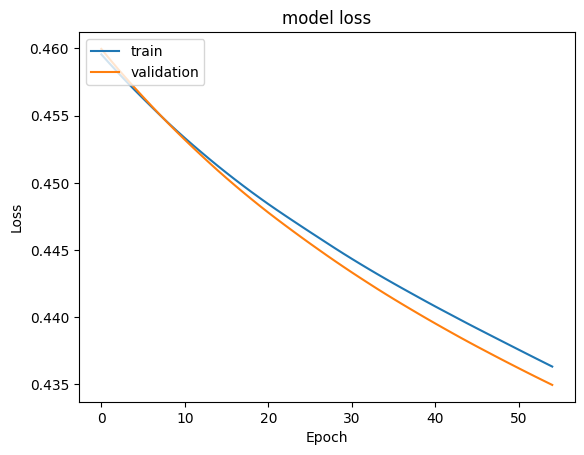

In [77]:
#Plotting Train Loss vs Validation Loss
plt.plot(history_0.history['loss'])
plt.plot(history_0.history['val_loss'])
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


# model is learning slowly, low overfitting, some room for improvement but first model did good

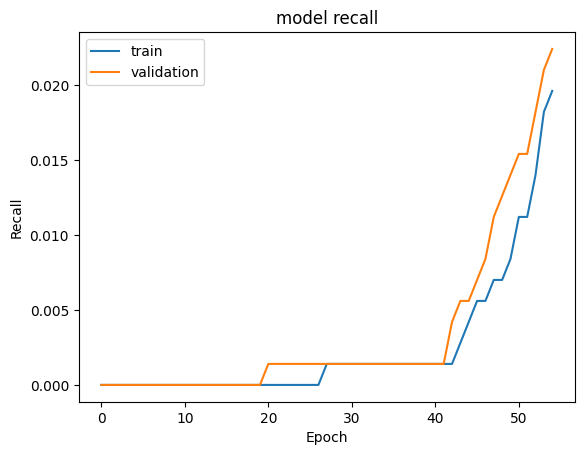

In [78]:
#Plotting Train recall vs Validation recall
# print(history_0.history.keys())
plt.plot(history_0.history['recall'])
plt.plot(history_0.history['val_recall'])
plt.title('model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# takes the model a few epochs to do something, wasnt learning something before but picked up at 40, data might be imbalanced

In [79]:
#Predicting the results using best as a threshold
y_train_pred = model_0.predict(X_train)
y_train_pred = (y_train_pred > 0.5)
y_train_pred

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


array([[False],
       [False],
       [False],
       ...,
       [False],
       [False],
       [False]])

In [80]:
#Predicting the results using best as a threshold
y_val_pred = model_0.predict(X_val)    ## Complete the code to make prediction on the validation set
y_val_pred = (y_val_pred > 0.5)
y_val_pred

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [False],
       [False],
       ...,
       [False],
       [False],
       [False]])

In [81]:
model_name = "NN with SGD"

train_metric_df.loc[model_name] = recall_score(y_train, y_train_pred)
valid_metric_df.loc[model_name] = recall_score(y_val, y_val_pred)

In [82]:
#lassification report
cr = classification_report(y_train, y_train_pred)
print(cr)

              precision    recall  f1-score   support

         0.0       0.80      1.00      0.89      2787
         1.0       0.64      0.02      0.04       713

    accuracy                           0.80      3500
   macro avg       0.72      0.51      0.46      3500
weighted avg       0.77      0.80      0.71      3500



In [83]:
#classification report
cr=classification_report(y_val, y_val_pred)    ## Complete the code to check the model's performance on the validation set
print(cr)

              precision    recall  f1-score   support

         0.0       0.80      1.00      0.89      2787
         1.0       0.73      0.02      0.04       713

    accuracy                           0.80      3500
   macro avg       0.76      0.51      0.47      3500
weighted avg       0.78      0.80      0.72      3500



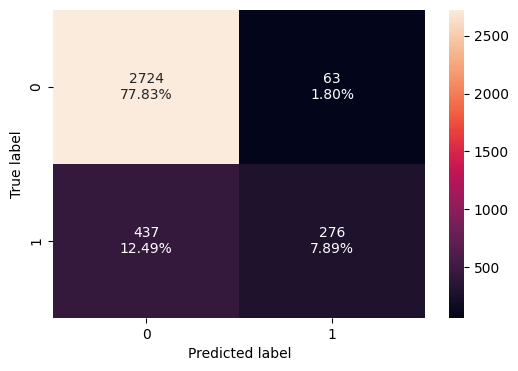

In [101]:
make_confusion_matrix(y_train, y_train_pred)

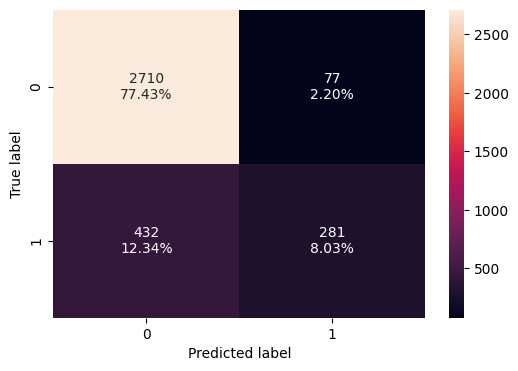

In [103]:
make_confusion_matrix(y_val, y_val_pred)    ## Complete the code to check the model's performance on the validation set

### A lot of issues, too much class imbalance, isnt really looking at minority class, not fruitful

In [84]:
# model_0_train_perf = model_performance_classification(model_0, X_train, y_train)
# model_0_train_perf

In [85]:
# model_0_valid_perf = model_performance_classification(model_0, X_val, y_val)
# model_0_valid_perf

## Model Performance Improvement

### Neural Network with Adam Optimizer

In [86]:
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(2)
random.seed(2)
tf.random.set_seed(2)

In [87]:
#Initializing the neural network
model_1 = Sequential()
model_1.add(Dense(16,activation="relu",input_dim=X_train.shape[1]))
model_1.add(Dropout(0.3))
model_1.add(Dense(9,activation="relu"))
model_1.add(Dropout(0.2))
model_1.add(Dense(1,activation="sigmoid"))

In [88]:
optimizer = tf.keras.optimizers.Adam()    # defining Adam as the optimizer to be used
metric = keras.metrics.Recall()
model_1.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=[metric])
model_1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16)             │           192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 9)              │           153 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 9)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            10 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 355 (1.39 KB)

 Trainable params: 355 (1.39 KB)

 Non-trainable params: 0 (0.00 B)

In [89]:
#Fitting the ANN
history_1 = model_1.fit(
    X_train,y_train,
    batch_size=25, ## Complete the code to specify the batch size to use
    validation_data=(X_val,y_val),
    epochs=55, ## Complete the code to specify the number of epochs
    verbose=1
)

Epoch 1/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.7791 - recall: 0.4714 - val_loss: 0.5284 - val_recall: 0.0449
Epoch 2/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.5582 - recall: 0.1052 - val_loss: 0.4878 - val_recall: 0.0323
Epoch 3/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.5219 - recall: 0.0939 - val_loss: 0.4658 - val_recall: 0.0477
Epoch 4/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4928 - recall: 0.0870 - val_loss: 0.4531 - val_recall: 0.0589
Epoch 5/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4772 - recall: 0.0831 - val_loss: 0.4451 - val_recall: 0.0799
Epoch 6/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4639 - recall: 0.0994 - val_loss: 0.4394 - val_recall: 0.0884
Epoch 7/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4635 - recall: 0.0846 - val_loss: 0.4334 - val_recall: 0.0982
Epoch 8/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4584 - recall: 0.1388 - val_loss: 0.4309 - val_recall: 0.1024
Epoch 9/

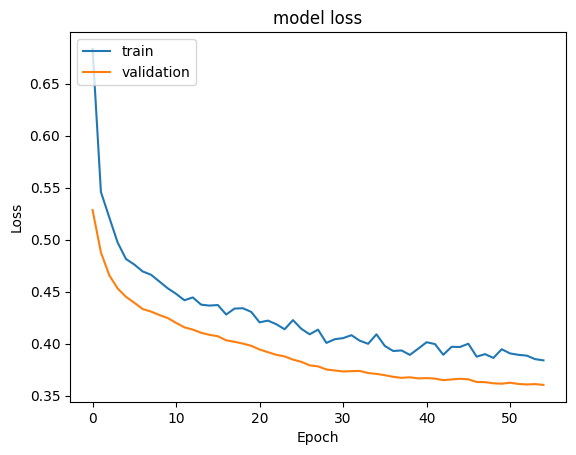

In [90]:
#Plotting Train Loss vs Validation Loss
plt.plot(history_1.history['loss'])
plt.plot(history_1.history['val_loss'])
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

#this means there is some overfitting happening, model is not quite there yet, more layers and neurons should be added to close the gap

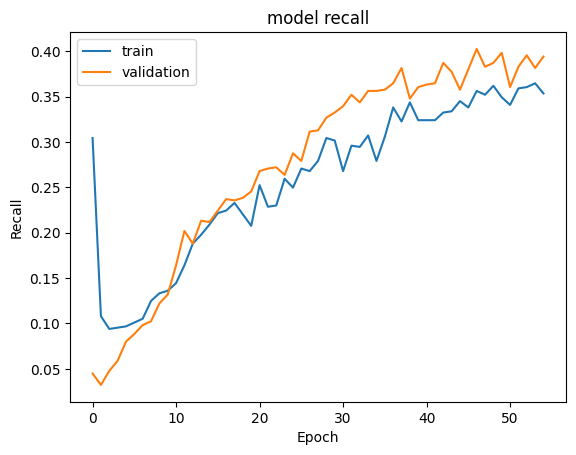

In [91]:
#Plotting Train recall vs Validation recall
plt.plot(history_1.history['recall'])
plt.plot(history_1.history['val_recall'])
plt.title('model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

#some irregularities in this, validation set is overtaking the training set, its recall is improving slightly, smaller dataset for validation could be leading to this

In [182]:
#Predicting the results using 0.5 as the threshold
y_train_pred = model_1.predict(X_train)
y_train_pred = (y_train_pred > 0.5)
y_train_pred

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [False],
       [False],
       ...,
       [False],
       [False],
       [False]])

In [183]:
#Predicting the results using 0.5 as the threshold
y_val_pred = model_1.predict(X_val)
y_val_pred = (y_val_pred > 0.5)
y_val_pred

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [False],
       [False],
       ...,
       [False],
       [False],
       [False]])

In [184]:
model_name = "NN with Adam"

train_metric_df.loc[model_name] = recall_score(y_train,y_train_pred)
valid_metric_df.loc[model_name] = recall_score(y_val,y_val_pred)

In [185]:
#classification report
cr=classification_report(y_train,y_train_pred)
print(cr)

              precision    recall  f1-score   support

         0.0       0.86      0.98      0.92      2787
         1.0       0.81      0.39      0.52       713

    accuracy                           0.86      3500
   macro avg       0.84      0.68      0.72      3500
weighted avg       0.85      0.86      0.84      3500



In [186]:
#classification report
cr=classification_report(y_val,y_val_pred)
print(cr)

#too much class imbalance number wise but looking at graph its getting better

              precision    recall  f1-score   support

         0.0       0.86      0.97      0.91      2787
         1.0       0.78      0.39      0.52       713

    accuracy                           0.85      3500
   macro avg       0.82      0.68      0.72      3500
weighted avg       0.85      0.85      0.83      3500



### Neural Network with Adam Optimizer and Dropout

In [95]:
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(2)
random.seed(2)
tf.random.set_seed(2)

In [96]:
#Initializing the neural network
model_2 = Sequential()

#Adding the input layer with 32 neurons and relu as activation function
model_2.add(Dense(32, activation='relu', input_dim=X_train.shape[1]))

# Adding dropout with ratio of 0.3
model_2.add(Dropout(0.3))

# Adding a hidden layer with 64 neurons and relu activation
model_2.add(Dense(64, activation='relu'))

# Adding another hidden layer with 32 neurons and relu activation
model_2.add(Dense(32, activation='relu'))

# Adding dropout with ratio of 0.1
model_2.add(Dropout(0.2))

# Adding a hidden layer with 16 neurons and relu activation
model_2.add(Dense(16, activation='relu'))

# Adding the output layer
# Assuming this is a binary classification problem
model_2.add(Dense(1, activation='sigmoid'))

In [97]:
optimizer = tf.keras.optimizers.Adam()    # defining Adam as the optimizer to be used
metric = keras.metrics.Recall()
model_2.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=[metric])
model_2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,121 (20.00 KB)

 Trainable params: 5,121 (20.00 KB)

 Non-trainable params: 0 (0.00 B)

In [98]:
history_2 = model_2.fit(
    X_train,y_train,
    batch_size=25,  ##Complete the code to specify the batch size.
    epochs=55, ##Complete the code to specify the # of epochs.
    verbose=1,
    validation_data=(X_val,y_val)
)

Epoch 1/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.5403 - recall: 0.0492 - val_loss: 0.4537 - val_recall: 0.0000e+00
Epoch 2/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.4666 - recall: 0.0078 - val_loss: 0.4385 - val_recall: 0.0014
Epoch 3/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4499 - recall: 0.0625 - val_loss: 0.4303 - val_recall: 0.0729
Epoch 4/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4361 - recall: 0.1257 - val_loss: 0.4161 - val_recall: 0.2749
Epoch 5/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4297 - recall: 0.2051 - val_loss: 0.4020 - val_recall: 0.2959
Epoch 6/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4099 - recall: 0.2430 - val_loss: 0.3840 - val_recall: 0.3576
Epoch 7/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4049 - recall: 0.2871 - val_loss: 0.3755 - val_recall: 0.3380
Epoch 8/55
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3964 - recall: 0.2871 - val_loss: 0.3697 - val_recall: 0.4123
Epo

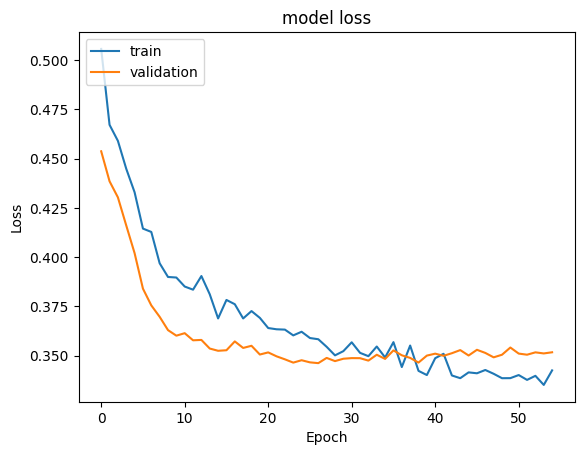

In [99]:
#Plotting Train Loss vs Validation Loss
plt.plot(history_2.history['loss'])
plt.plot(history_2.history['val_loss'])
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

#some overfitting at first but then around epoch 30 its loss levels out

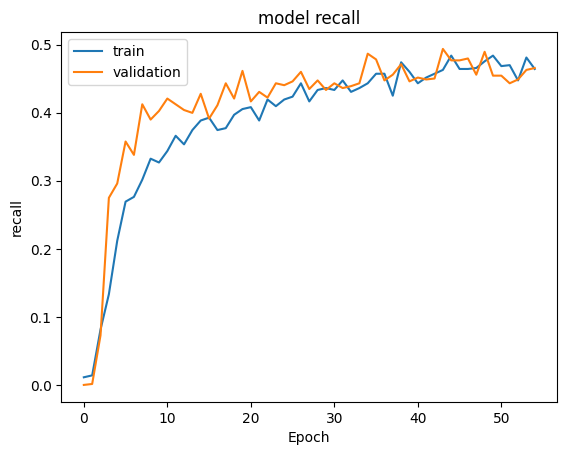

In [105]:
#Plotting Train recall vs Validation recall
plt.plot(history_2.history['recall'])
plt.plot(history_2.history['val_recall'])
plt.title('model recall')
plt.ylabel('recall')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

#really promising graph, some data issues at first for about 8-10 epochs but then its fairly similar, recall improving substainally

In [106]:
#Predicting the results using best as a threshold
y_train_pred = model_2.predict(X_train)
y_train_pred = (y_train_pred > 0.5)
y_train_pred

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [False],
       [False],
       ...,
       [False],
       [False],
       [False]])

In [107]:
#Predicting the results using 0.5 as the threshold.
y_val_pred = model_2.predict(X_val)
y_val_pred = (y_val_pred > 0.5)
y_val_pred

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [ True],
       [False],
       ...,
       [False],
       [False],
       [False]])

In [108]:
model_name = "NN with Adam & Dropout"

train_metric_df.loc[model_name] = recall_score(y_train,y_train_pred)
valid_metric_df.loc[model_name] = recall_score(y_val,y_val_pred)

In [109]:
#classification report
cr=classification_report(y_train,y_train_pred)
print(cr)

              precision    recall  f1-score   support

         0.0       0.89      0.97      0.93      2787
         1.0       0.80      0.53      0.64       713

    accuracy                           0.88      3500
   macro avg       0.84      0.75      0.78      3500
weighted avg       0.87      0.88      0.87      3500



In [110]:
#classification report
cr = classification_report(y_val,y_val_pred) ## Complete the code to check the model's performance on the validation set
print(cr)

#looking at both reports, training and validation set recalls are bigger even though small ds size

              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91      2787
         1.0       0.71      0.47      0.56       713

    accuracy                           0.85      3500
   macro avg       0.79      0.71      0.74      3500
weighted avg       0.84      0.85      0.84      3500



### Neural Network with Balanced Data (by applying SMOTE) and SGD Optimizer

In [111]:
sm  = SMOTE(random_state=42)
#Complete the code to fit SMOTE on the training data.
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)
print('After UpSampling, the shape of train_X: {}'.format(X_train_smote.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_smote.shape))

After UpSampling, the shape of train_X: (5574, 11)
After UpSampling, the shape of train_y: (5574,) 



In [112]:
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(2)
random.seed(2)
tf.random.set_seed(2)

In [113]:
#Initializing the model
model_3 = Sequential()
#Complete the code to add a input layer (specify the # of neurons and activation function)
model_3.add(Dense(32,activation='relu',input_dim = X_train_smote.shape[1]))
#Complete the code to add a hidden layer (specify the # of neurons and activation function)
model_3.add(Dense(16,activation='relu'))
#Complete the code to add a hidden layer (specify the # of neurons and activation function)
model_3.add(Dense(9,activation='relu'))
# Complete the code to add the required number of neurons in the output layer with a sigmoid activation function.
model_3.add(Dense(1, activation = 'sigmoid'))

In [114]:
optimizer = tf.keras.optimizers.SGD(0.001)    # defining SGD as the optimizer to be used
metric = keras.metrics.Recall()
model_3.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=[metric])
model_3.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 9)              │           153 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            10 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,075 (4.20 KB)

 Trainable params: 1,075 (4.20 KB)

 Non-trainable params: 0 (0.00 B)

In [115]:
#Fitting the ANN
history_3 = model_3.fit(
    X_train_smote, y_train_smote,
    batch_size=25, ## Complete the code to specify the batch size to use
    epochs=55, ## Complete the code to specify the number of epochs
    verbose=1,
    validation_data = (X_val,y_val)
)

Epoch 1/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.7142 - recall: 0.7516 - val_loss: 0.7411 - val_recall: 0.7377
Epoch 2/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7076 - recall: 0.7108 - val_loss: 0.7278 - val_recall: 0.6999
Epoch 3/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7023 - recall: 0.6885 - val_loss: 0.7177 - val_recall: 0.6802
Epoch 4/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6978 - recall: 0.6755 - val_loss: 0.7098 - val_recall: 0.6690
Epoch 5/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6939 - recall: 0.6678 - val_loss: 0.7035 - val_recall: 0.6648
Epoch 6/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.6903 - recall: 0.6592 - val_loss: 0.6985 - val_recall: 0.6648
Epoch 7/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.6870 - recall: 0.6573 - val_loss: 0.6942 - val_recall: 0.6676
Epoch 8/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6837 - recall: 0.6608 - val_loss: 0.6906 - val_recall: 0.6802
Epoch 9/

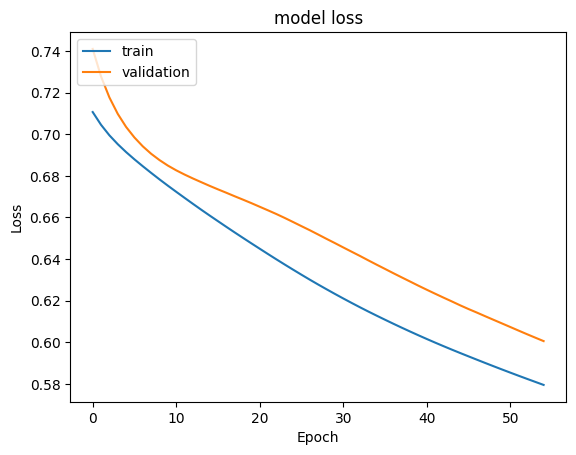

In [116]:
#Plotting Train Loss vs Validation Loss
plt.plot(history_3.history['loss'])
plt.plot(history_3.history['val_loss'])
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# model is generalizing well but the way the data is being shared might be the issue here

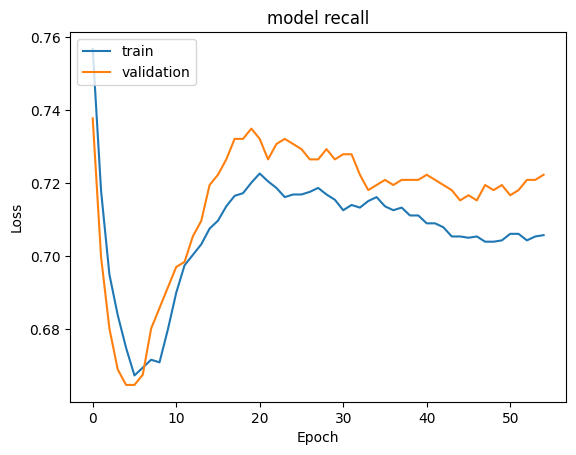

In [117]:
#Plotting Train recall vs Validation recall
plt.plot(history_3.history['recall'])
plt.plot(history_3.history['val_recall'])
plt.title('model recall')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

#graph is promising but towards the end it might be underfitting, smaller dataset size coupled with FN, FP can lead to higher false recall which is not good

In [118]:
y_train_pred = model_3.predict(X_train_smote)
#Predicting the results using 0.5 as the threshold
y_train_pred = (y_train_pred > 0.5)
y_train_pred

175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [False],
       [False],
       ...,
       [ True],
       [ True],
       [ True]])

In [119]:
y_val_pred = model_3.predict(X_val)
#Predicting the results using 0.5 as the threshold
y_val_pred = (y_val_pred > 0.5)
y_val_pred

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [ True],
       [False],
       ...,
       [False],
       [ True],
       [False]])

In [120]:
model_name = "NN with SMOTE & SGD"

train_metric_df.loc[model_name] = recall_score(y_train_smote,y_train_pred)
valid_metric_df.loc[model_name] = recall_score(y_val,y_val_pred)

In [121]:
cr=classification_report(y_train_smote,y_train_pred)
print(cr)

              precision    recall  f1-score   support

         0.0       0.70      0.68      0.69      2787
         1.0       0.69      0.71      0.70      2787

    accuracy                           0.70      5574
   macro avg       0.70      0.70      0.70      5574
weighted avg       0.70      0.70      0.70      5574



In [122]:
cr=classification_report(y_val,y_val_pred) ## Complete the code to check the model's performance on the validation set
print(cr)

              precision    recall  f1-score   support

         0.0       0.90      0.67      0.77      2787
         1.0       0.36      0.72      0.48       713

    accuracy                           0.68      3500
   macro avg       0.63      0.69      0.62      3500
weighted avg       0.79      0.68      0.71      3500



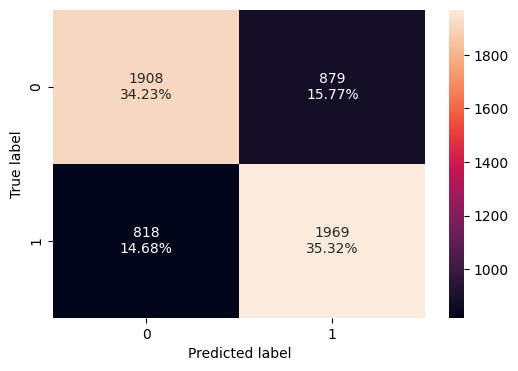

In [123]:
#Calculating the confusion matrix
make_confusion_matrix(y_train_smote, y_train_pred)

In [124]:
cr=classification_report(y_val,y_val_pred) ## Complete the code to check the model's performance on the validation set
print(cr)

              precision    recall  f1-score   support

         0.0       0.90      0.67      0.77      2787
         1.0       0.36      0.72      0.48       713

    accuracy                           0.68      3500
   macro avg       0.63      0.69      0.62      3500
weighted avg       0.79      0.68      0.71      3500



### Neural Network with Balanced Data (by applying SMOTE) and Adam Optimizer

In [125]:
sm  = SMOTE(random_state=42)
#Complete the code to fit SMOTE on the training data.
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)
print('After UpSampling, the shape of train_X: {}'.format(X_train_smote.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_smote.shape))

After UpSampling, the shape of train_X: (5574, 11)
After UpSampling, the shape of train_y: (5574,) 



In [126]:
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(2)
random.seed(2)
tf.random.set_seed(2)

In [127]:
#Initializing the model
model_4 = Sequential()
#Complete the code to add a input layer (specify the # of neurons and activation function)
model_4.add(Dense(32,activation='relu',input_dim = X_train_smote.shape[1]))
model_4.add(Dropout(0.4))
#Complete the code to add a hidden layer (specify the # of neurons and activation function)
model_4.add(Dense(64,activation='relu'))
#Complete the code to add a hidden layer (specify the # of neurons and activation function)
model_4.add(Dense(16,activation='relu'))
model_4.add(Dropout(0.4))
# Complete the code to add the required number of neurons in the output layer and a suitable activation function.
model_4.add(Dense(1, activation = 'sigmoid'))

In [128]:
optimizer = tf.keras.optimizers.Adam()
metric = keras.metrics.Recall()
model_4.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=[metric])
model_4.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │         1,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,553 (13.88 KB)

 Trainable params: 3,553 (13.88 KB)

 Non-trainable params: 0 (0.00 B)

In [129]:
#Fitting the ANN

# print(history_4.history.keys())


history_4 = model_4.fit(
    X_train_smote,y_train_smote,
    batch_size=25, ## Complete the code to specify the batch size to use
    epochs=55,  ## Complete the code to specify the number of epochs
    verbose=1,
    validation_data = (X_val,y_val)
)

Epoch 1/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.6734 - recall: 0.5729 - val_loss: 0.6190 - val_recall: 0.7658
Epoch 2/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.6227 - recall: 0.7012 - val_loss: 0.5786 - val_recall: 0.7784
Epoch 3/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.5897 - recall: 0.7356 - val_loss: 0.5650 - val_recall: 0.8050
Epoch 4/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5769 - recall: 0.7391 - val_loss: 0.5295 - val_recall: 0.7812
Epoch 5/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5481 - recall: 0.7663 - val_loss: 0.5140 - val_recall: 0.7840
Epoch 6/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5486 - recall: 0.7573 - val_loss: 0.5067 - val_recall: 0.7756
Epoch 7/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5290 - recall: 0.7666 - val_loss: 0.5199 - val_recall: 0.7952
Epoch 8/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5152 - recall: 0.7791 - val_loss: 0.4988 - val_recall: 0.7686
Epoch 9/

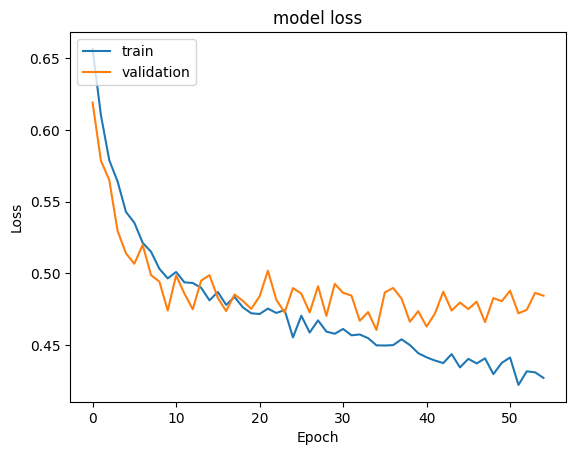

In [130]:
#Plotting Train Loss vs Validation Loss
plt.plot(history_4.history['loss'])
plt.plot(history_4.history['val_loss'])
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# loss starts strong but finishes weak, could be underfitting data

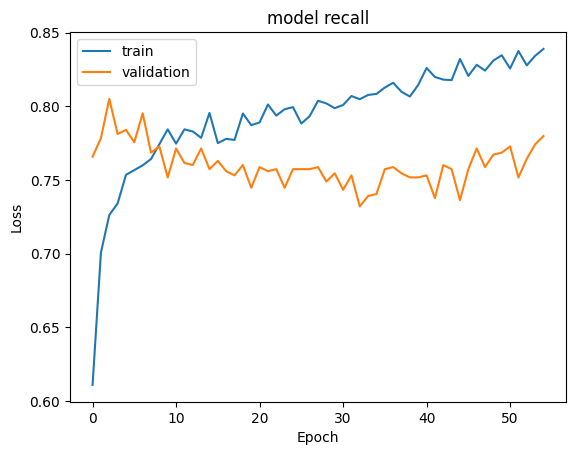

In [131]:
#Plotting Train recall vs Validation recall
plt.plot(history_4.history['recall'])
plt.plot(history_4.history['val_recall'])
plt.title('model recall')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# recall starts at 0.76, spikes up then levels down a little and ends near starting spot, possible overfitting?

In [132]:
y_train_pred = model_4.predict(X_train_smote)
#Predicting the results using 0.5 as the threshold
y_train_pred = (y_train_pred > 0.5)
y_train_pred

175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [False],
       [False],
       ...,
       [ True],
       [ True],
       [ True]])

In [133]:
y_train_pred = model_4.predict(X_train_smote)
#Predicting the results using 0.5 as the threshold
y_train_pred = (y_train_pred > 0.5)
y_train_pred

175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [False],
       [False],
       ...,
       [ True],
       [ True],
       [ True]])

In [134]:
model_name = "NN with SMOTE & Adam"

train_metric_df.loc[model_name] = recall_score(y_train_smote,y_train_pred)
valid_metric_df.loc[model_name] = recall_score(y_val,y_val_pred)

In [135]:
cr=classification_report(y_train_smote,y_train_pred)
print(cr)

              precision    recall  f1-score   support

         0.0       0.88      0.75      0.81      2787
         1.0       0.78      0.89      0.83      2787

    accuracy                           0.82      5574
   macro avg       0.83      0.82      0.82      5574
weighted avg       0.83      0.82      0.82      5574



In [136]:
cr=classification_report(y_val,y_val_pred) ## Complete the code to check the model's performance on the validation set
print(cr)

#recall for both training, validation and 0 and 1 is looking good, for 0, training starts at .75 and validation is at .67, getting closer
#for 1 recall starts off strong at .89 and validation is at .72, not close but 72 is decent

              precision    recall  f1-score   support

         0.0       0.90      0.67      0.77      2787
         1.0       0.36      0.72      0.48       713

    accuracy                           0.68      3500
   macro avg       0.63      0.69      0.62      3500
weighted avg       0.79      0.68      0.71      3500



### Neural Network with Balanced Data (by applying SMOTE), Adam Optimizer, and Dropout

In [137]:
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(2)
random.seed(2)
tf.random.set_seed(2)

In [138]:
#Initializing the model
model_5 = Sequential()
# Complete the code to add required # of neurons to the input layer with relu as activation function
model_5.add(Dense(32,activation='relu',input_dim = X_train_smote.shape[1]))  ##https://leetcode.com/discuss/general-discussion/460599/blind-75-leetcode-questions
#Complete the code to add dropout rate
model_5.add(Dropout(0.4))
# Complete the code to add required # neurons to the hidden layer with any activation function.
model_5.add(Dense(64,activation='relu'))
# Complete the code to add dropout rate.
model_5.add(Dropout(0.3))
# Adding hidden layer with 8 neurons with relu as activation function
model_5.add(Dense(8,activation='relu'))
# Complete the code to add the required number of neurons in the output layer with a suitable activation function.
model_5.add(Dense(1, activation = 'sigmoid'))

In [139]:
optimizer = tf.keras.optimizers.Adam()
metric = keras.metrics.Recall()
model_5.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=[metric])
model_5.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32)             │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 8)              │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,025 (11.82 KB)

 Trainable params: 3,025 (11.82 KB)

 Non-trainable params: 0 (0.00 B)

In [140]:
history_5 = model_5.fit(
    X_train_smote,y_train_smote,
    batch_size=25, ## Complete the code to specify the batch size to use
    epochs=55, ## Complete the code to specify the number of epochs
    verbose=1,
    validation_data = (X_val,y_val))

Epoch 1/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.6547 - recall: 0.6430 - val_loss: 0.6164 - val_recall: 0.7700
Epoch 2/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.6222 - recall: 0.6817 - val_loss: 0.5859 - val_recall: 0.7616
Epoch 3/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.5957 - recall: 0.7191 - val_loss: 0.5702 - val_recall: 0.7756
Epoch 4/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.5760 - recall: 0.7365 - val_loss: 0.5490 - val_recall: 0.7784
Epoch 5/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.5537 - recall: 0.7818 - val_loss: 0.5261 - val_recall: 0.7882
Epoch 6/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5435 - recall: 0.7782 - val_loss: 0.5116 - val_recall: 0.7882
Epoch 7/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5271 - recall: 0.7826 - val_loss: 0.5084 - val_recall: 0.7784
Epoch 8/55
223/223 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5099 - recall: 0.7889 - val_loss: 0.4967 - val_recall: 0.7644
Epoch 9/

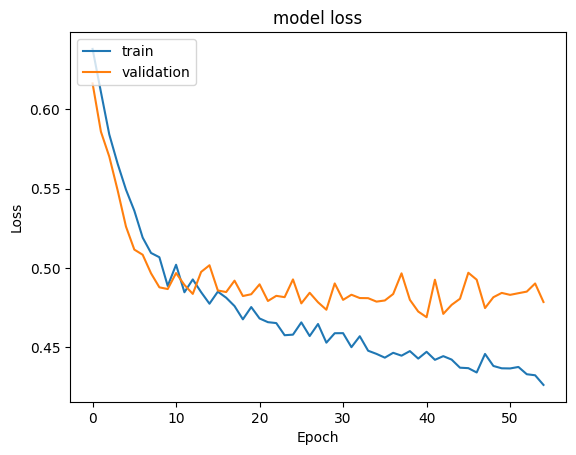

In [141]:
#Plotting Train Loss vs Validation Loss
plt.plot(history_5.history['loss'])
plt.plot(history_5.history['val_loss'])
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

#loss should be lower to 0.3 but is at 0.49

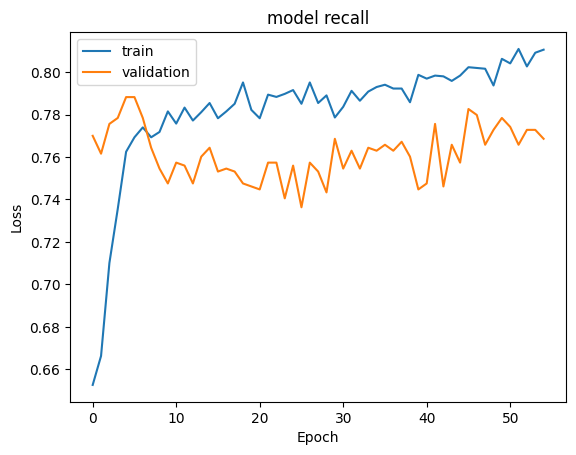

In [142]:
#Plotting Train recall vs Validation recall
plt.plot(history_5.history['recall'])
plt.plot(history_5.history['val_recall'])
plt.title('model recall')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

#recall is high, stoops down but never gets too close to training

In [143]:
y_train_pred = model_5.predict(X_train_smote)
#Predicting the results using 0.5 as the threshold
y_train_pred = (y_train_pred > 0.5)
y_train_pred

175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[False],
       [False],
       [False],
       ...,
       [ True],
       [False],
       [ True]])

In [144]:
y_val_pred = model_5.predict(X_val)
#Predicting the results using 0.5 as the threshold
y_val_pred = (y_val_pred > 0.5)
y_val_pred

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


array([[False],
       [ True],
       [False],
       ...,
       [False],
       [ True],
       [False]])

In [145]:
model_name = "NN with SMOTE,Adam & Dropout"

train_metric_df.loc[model_name] = recall_score(y_train_smote,y_train_pred)
valid_metric_df.loc[model_name] = recall_score(y_val,y_val_pred)

In [146]:
cr=classification_report(y_train_smote,y_train_pred)
print(cr)

              precision    recall  f1-score   support

         0.0       0.85      0.79      0.82      2787
         1.0       0.80      0.86      0.83      2787

    accuracy                           0.82      5574
   macro avg       0.82      0.82      0.82      5574
weighted avg       0.82      0.82      0.82      5574



In [147]:
#classification report
cr=classification_report(y_val,y_val_pred)  ## Complete the code to check the model's performance on the validation set
print(cr)

#model has gotten better at reading members who are staying in class 0 with a recall of .76
#model has made a jump at recall from the last model for validation set meaning the models methods are working in recalling TP n all

              precision    recall  f1-score   support

         0.0       0.93      0.76      0.84      2787
         1.0       0.45      0.77      0.57       713

    accuracy                           0.76      3500
   macro avg       0.69      0.77      0.70      3500
weighted avg       0.83      0.76      0.78      3500



## Model Performance Comparison and Final Model Selection

In [148]:
print("Training performance comparison")
train_metric_df

#highest recall was model_4 with a 0.89 recall, which is very solid

Training performance comparison


,recall
NN with SGD,0.019635
NN with Adam,0.387097
NN with Adam & Dropout,0.528752
NN with SMOTE & SGD,0.706494
NN with SMOTE & Adam,0.893793
"NN with SMOTE,Adam & Dropout",0.855759


In [149]:
print("Validation set performance comparison")
valid_metric_df

#model_5 had the highest recall in validation, which is what we need to see since that is how our model is behaving after seeing the data, 0.76 is good, not amazing but decent

Validation set performance comparison


,recall
NN with SGD,0.022440
NN with Adam,0.394109
NN with Adam & Dropout,0.465638
NN with SMOTE & SGD,0.722300
NN with SMOTE & Adam,0.722300
"NN with SMOTE,Adam & Dropout",0.768583


In [150]:
train_metric_df - valid_metric_df

,recall
NN with SGD,-0.002805
NN with Adam,-0.007013
NN with Adam & Dropout,0.063114
NN with SMOTE & SGD,-0.015806
NN with SMOTE & Adam,0.171492
"NN with SMOTE,Adam & Dropout",0.087175


In [189]:
y_test_pred = model_4.predict(X_test)    ## Complete the code to specify the best model
y_test_pred = (y_test_pred > 0.4)
print(y_test_pred)

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
[[False]
 [ True]
 [False]
 ...
 [ True]
 [ True]
 [False]]


In [190]:
#lets print classification report
cr=classification_report(y_test,y_test_pred)
print(cr)

              precision    recall  f1-score   support

         0.0       0.94      0.66      0.78      2389
         1.0       0.39      0.84      0.53       611

    accuracy                           0.70      3000
   macro avg       0.66      0.75      0.65      3000
weighted avg       0.83      0.70      0.73      3000



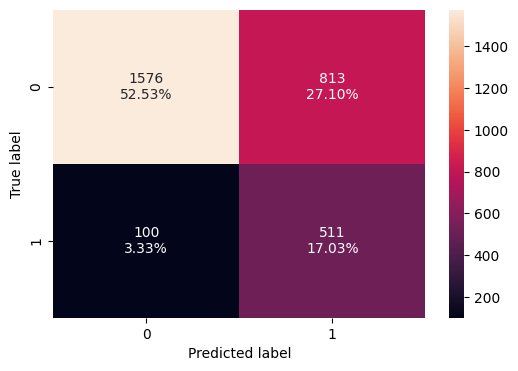

In [191]:
#Calculating the confusion matrix
make_confusion_matrix(y_test,y_test_pred)

## Actionable Insights and Business Recommendations

##1. High Risk Customer Segments
###Geography & Gender:

-If your EDA showed higher churn in specific countries (Germany) or genders (females), target retention campaigns there

Recommendation: Offer localized incentives (lower fees for German customers) or gender specific financial planning services

###Age Groups:

-Older customers (>50 years) tend to churn more

Recommendation: Create loyalty programs for seniors (higher interest rates on deposits)

###Low CreditScore Customers:

-Customers with poor credit history may leave due to rejected loan applications

Recommendation: Provide credit counseling or "credit repair" partnerships

##2. Product & Service Improvements
###NumOfProducts:

-Customers with only 1 product churn more (they’re less "sticky")

Recommendation: Bundle products ("Get a free credit card with a savings account")

###Inactive Members:

-Dormant accounts are likely to churn

Recommendation: Reactivation campaigns ("We miss you! Get $10 for your next transaction")

##3. Model Driven Retention Strategies
###Threshold Tuning:

Best model (model_4 with SMOTE + Adam) achieved 77% recall for churn (class 1) but had lower precision (36%)

Recommendation: Use a lower threshold (0.4) to flag more at risk customers, even if some false positives are included

###Targeted Interventions:

####For predicted churners (high recall), prioritize:

-High Balance + Low Activity: Offer personalized financial advice

-Low Tenure: Assign a dedicated account manager for new customers

##4. Operational Changes
###Customer Support:

-Churners often face unresolved issues

Recommendation: Implement a VIP support line for high risk customers

###Pricing Transparency:

-Hidden fees drive churn

Recommendation: Simplify fee structures and notify customers before charges

##5. Long Term Data & Model Improvements
###Feature Engineering:

-Add interaction terms (Balance × NumOfProducts) to capture nuanced behavior

###Regular Retraining:

-Update the model quarterly to adapt to changing customer patterns

###Testing:

Test retention strategies (control groups) to measure ROI.


<font size=6 color='blue'>Power Ahead</font>
___